<a href="https://colab.research.google.com/github/litimamine/ML/blob/master/OrangeTN_Data_analysis_and_churn_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# $$ Orange TN -  HR Dep - Data exploration & Churn Prediction $$
By A.Litim

In [1]:
# &> /dev/null to hide cell output 

# shap is a game theory based approach explaining the output of any machine learning model
!pip install shap &> /dev/null


# To handle data imbalance (FOR SMOTE BALANCING)
!pip install imbalanced-learn &> /dev/null

# Pycaret for ML modeling and comparaison 
!pip install pycaret[full] &> /dev/null

# for Auto exploratory data analysis reports

!pip install sweetviz  &> /dev/null
!pip install pandas-profiling  &> /dev/null

# In order to render interactive plots in Google Colab
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 

%matplotlib inline

In [3]:
# Importing the required libraries for EDA

# importing sweetviz
import sweetviz as sv

# importing profiling package
from pandas_profiling import ProfileReport

# I - Analytical Section: Exploratory Data Analysis




Exploratory Data Analysis (EDA) is the process of gaining a better understanding of data sets by summarizing and visualizing their primary properties. This stage is critical, particularly when it comes to modeling the data in order to apply Machine Learning. Histograms, Box plots, Scatter plots, and other plotting options are available in EDA. Exploring the data can take a long time. We can ask to define the problem statement or definition on our data set through the EDA procedure, which is very crucial.


In [4]:
# Display all columns in a dataframe 
pd.set_option('display.max_columns', 30)

In [5]:
# Loading the data into the data frame
data = pd.read_csv('https://raw.githubusercontent.com/litimamine/ML/master/OrangeTN_churn_project/orangeTN_dataset.csv', header= 0)
data.head()

,Indexed Registration Number,Left: Yes/ No,Department,Post,Entry Date,Years spent at the Company,Departure Date,Gender,Birth Date,Age / Age when leaving,Home Address,Postal Code,City,Town,Marital Status,...,Global Appreciation_S2 2015,Global Appreciation_ S1 2016,Global Appreciation_S2 2016,Global Appreciation_ S1 2017,Global Appreciation_S2 2017,Global Appreciation_ S1 2018,Global Appreciation S2 2018,Global Appreciation S1 2019,Global Appreciation_S2 2019,Global Appreciation_ S1 2020,Global Appreciation_S2,Number of Trainings 2017,Number of Trainings 2018,Number of Trainings 2019,Number of Trainings 2020
0,27,NO,DFI,Recouvreur Terrain B2B,7/1/2004,16.936986,NaN,Masculin,5/21/1977,44.068493,15 Rue Ali Ben Ghdhehem Kram Ouest Tunis,2089,Tunis,Kram Ouest,Marié(e),...,4,4,3,3,3,2,4,3,4,4,4,0.0,1.0,0.0,NaN
1,30,NO,DG,Agent Administratif,1/1/2004,17.435616,NaN,Féminin,1/1/1975,46.454795,5 Rue 6972 Cité Intilaka Tunis,1064,Tunis,Cité Intilaka,Marié(e),...,5,4,5,4,4,4,4,0,0,0,0,0.0,0.0,0.0,NaN
2,33,NO,DRS,Chef de service Transmission Capillaire,10/1/2004,16.684932,NaN,Masculin,1/7/1966,55.443836,Imm Nesrine 1 Appt 62 Résidence Riadh Soukra 2...,2045,Ariana,L'Aouina,Marié(e),...,2,3,3,3,3,4,3,4,3,0,3,2.0,4.0,4.0,NaN
3,36,NO,DRH,Spécialiste Administration RH,2/1/2005,16.347945,NaN,Féminin,5/25/1978,43.057534,n 8 Rue 6217 Cité Intilaka Tunis,1064,Tunis,Cité Intilaka,Marié(e),...,4,3,4,4,4,4,4,3,3,3,3,0.0,2.0,0.0,NaN
4,63,NO,DRS,Manager D1,12/1/2006,14.517808,NaN,Masculin,9/25/1969,51.726027,Résédence ESSALEM6 N 3 Cité Olymipque 10 03 Tu...,1003,Tunis,Tunis,Marié(e),...,4,3,3,3,4,3,4,5,3,3,5,2.0,4.0,2.0,1.0


In [6]:
# checking data types
data.dtypes

Indexed Registration Number        int64
Left: Yes/ No                     object
Department                        object
Post                              object
Entry Date                        object
Years spent at the Company       float64
Departure Date                    object
Gender                            object
Birth Date                        object
Age / Age when leaving           float64
Home Address                      object
Postal Code                       object
City                              object
Town                              object
Marital Status                    object
Number of Children               float64
 Bonus Coef                      float64
Assignment                        object
Assignment Coordinates            object
Indexed Salary                   float64
Number of Hours                   object
Classification                    object
Global Appreciation_S2 2014        int64
Global Appreciation_S1 2015        int64
Global Appreciat

#### As the Null values test avove shows, most of the Columns do already include Null values that should be handled. 
#### First , we do need to translate some of our null values into meaningfull data in order to preserve them from getting dropped.

In [7]:
# Checking the missing values in the dataset.
data.isnull().sum()

Indexed Registration Number         0
Left: Yes/ No                       0
Department                          0
Post                                0
Entry Date                          0
Years spent at the Company          0
Departure Date                   1140
Gender                              0
Birth Date                          0
Age / Age when leaving              0
Home Address                       29
Postal Code                       756
City                              783
Town                             1148
Marital Status                      2
Number of Children                 75
 Bonus Coef                        92
Assignment                        322
Assignment Coordinates            647
Indexed Salary                      0
Number of Hours                     0
Classification                      0
Global Appreciation_S2 2014         0
Global Appreciation_S1 2015         0
Global Appreciation_S2 2015         0
Global Appreciation_ S1 2016        0
Global Appre

In [8]:
#clean up the dataset from columns missing more than 50% of their data and displaying deleted columns 
# df.count() does not include NaN values
df = data[[column for column in data if data[column].count() / len(data) >= 0.5]]

print("List of dropped columns :", end=" ")
for c in data.columns:
    if c not in df.columns:
        print(c, end=", ")
print('\n')
data = df

List of dropped columns : Departure Date, Postal Code, City, Town, Number of Trainings 2020, 



In [9]:
#Drop unique columns
data.drop(columns = {'Home Address','Post','Indexed Registration Number ', 'Assignment Coordinates'} , inplace=True, errors='ignore')

In [10]:
# Display Data
data

,Left: Yes/ No,Department,Entry Date,Years spent at the Company,Gender,Birth Date,Age / Age when leaving,Marital Status,Number of Children,Bonus Coef,Assignment,Indexed Salary,Number of Hours,Classification,Global Appreciation_S2 2014,Global Appreciation_S1 2015,Global Appreciation_S2 2015,Global Appreciation_ S1 2016,Global Appreciation_S2 2016,Global Appreciation_ S1 2017,Global Appreciation_S2 2017,Global Appreciation_ S1 2018,Global Appreciation S2 2018,Global Appreciation S1 2019,Global Appreciation_S2 2019,Global Appreciation_ S1 2020,Global Appreciation_S2,Number of Trainings 2017,Number of Trainings 2018,Number of Trainings 2019
0,NO,DFI,7/1/2004,16.936986,Masculin,5/21/1977,44.068493,Marié(e),2.0,1.0,DFI RECOUVREMENT,12.789795,40h,A8.1,0,4,4,4,3,3,3,2,4,3,4,4,4,0.0,1.0,0.0
1,NO,DG,1/1/2004,17.435616,Féminin,1/1/1975,46.454795,Marié(e),2.0,1.0,SIEGE,9.274080,40h,unkown,0,0,5,4,5,4,4,4,4,0,0,0,0,0.0,0.0,0.0
2,NO,DRS,10/1/2004,16.684932,Masculin,1/7/1966,55.443836,Marié(e),2.0,2.0,CROISIERE CHARGUIA,32.239050,40h,CM1.1,2,3,2,3,3,3,3,4,3,4,3,0,3,2.0,4.0,4.0
3,NO,DRH,2/1/2005,16.347945,Féminin,5/25/1978,43.057534,Marié(e),1.0,1.0,DIVONA,14.136502,40h,A8.1,0,4,4,3,4,4,4,4,4,3,3,3,3,0.0,2.0,0.0
4,NO,DRS,12/1/2006,14.517808,Masculin,9/25/1969,51.726027,Marié(e),2.0,2.0,CROISIERE CHARGUIA,34.397175,40h,CM2.1,3,4,4,3,3,3,4,3,4,5,3,3,5,2.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1457,Yes,DMC,12/10/2012,7.739726,Masculin,11/15/1973,46.835616,Marié(e),2.0,2.0,NaN,46.238175,40h,CM3.1,3,3,0,4,4,4,4,4,4,4,4,4,0,1.0,5.0,3.0
1458,Yes,DRE,7/6/2020,0.153425,Masculin,4/22/1984,36.383562,Marié(e),2.0,2.0,NaN,32.250233,40h,unkown,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
1459,Yes,DME,1/1/2018,2.717808,Féminin,6/24/1991,29.260274,Marié(e),1.0,1.0,NaN,8.066707,40h,unkown,0,0,0,0,0,0,0,4,3,3,4,3,0,NaN,1.0,1.0
1460,Yes,DFI,2/8/2010,10.578082,Féminin,2/16/1974,46.580822,Marié(e),2.0,2.0,NaN,30.809700,40h,CM2.1,3,3,4,4,4,4,4,4,4,0,3,0,0,3.0,0.0,1.0


In [11]:
# Dispplay Number of Hours unique values
data['Number of Hours'].unique()

array(['40h', '25h', '25H', '40H', '0', '-', '40h '], dtype=object)

In [12]:
data['Number of Hours'] = data['Number of Hours'].replace('40h ', 40)
data['Number of Hours'] = data['Number of Hours'].replace('40h', 40)
data['Number of Hours'] = data['Number of Hours'].replace('25h', 25)
data['Number of Hours'] = data['Number of Hours'].replace('40H', 40)
data['Number of Hours'] = data['Number of Hours'].replace('25H', 25)
data['Number of Hours'] = data['Number of Hours'].replace('25H', 25)
data['Number of Hours'] = data['Number of Hours'].replace('-', np.nan)

In [13]:
data['Number of Hours'].unique()

array([40, 25, '0', nan], dtype=object)

In [14]:
# Round data
data['Years spent at the Company'] = round(data['Years spent at the Company'])
data['Age / Age when leaving'] = round(data['Age / Age when leaving'])
data['Indexed Salary'] = round(data['Indexed Salary'], 2)

In [15]:
df = data[['Global Appreciation_S2 2014',
       'Global Appreciation_S1 2015', 'Global Appreciation_S2 2015',
       'Global Appreciation_ S1 2016', 'Global Appreciation_S2 2016',
       'Global Appreciation_ S1 2017', 'Global Appreciation_S2 2017',
       'Global Appreciation_ S1 2018 ', 'Global Appreciation S2 2018',
       'Global Appreciation S1 2019', 'Global Appreciation_S2 2019',
       'Global Appreciation_ S1 2020', 'Global Appreciation_S2 ']]


df2 = data[['Number of Trainings 2017', 'Number of Trainings 2018',
            'Number of Trainings 2019 ' ]]

In [16]:
df['mean_appreciation'] = round(df.mean(axis=1),1)
df2['mean_training'] = round(df2.mean(axis=1),1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [17]:
data['mean_global_appreciation'] = df['mean_appreciation']
data['mean_nbr_of_training'] = df2['mean_training']

In [18]:
#Dropping unnecessary columns manually 
to_drop = ['Global Appreciation_S2 2014',
       'Global Appreciation_S1 2015', 'Global Appreciation_S2 2015',
       'Global Appreciation_ S1 2016', 'Global Appreciation_S2 2016',
       'Global Appreciation_ S1 2017', 'Global Appreciation_S2 2017',
       'Global Appreciation_ S1 2018 ', 'Global Appreciation S2 2018',
       'Global Appreciation S1 2019', 'Global Appreciation_S2 2019',
       'Global Appreciation_ S1 2020', 'Global Appreciation_S2 ',
        'Number of Trainings 2017', 'Number of Trainings 2018',
        'Number of Trainings 2019 ']

data.drop(to_drop, inplace=True, errors='ignore' ,axis=1)

In [19]:
data['Number of Hours'].value_counts()

40    1360
0       91
25      10
Name: Number of Hours, dtype: int64

Here, number of hours = 0 indicates that the employees in questions already left.

This means that the number of work hours will be very correlated to the target value and should be eliminated during the feature_engineering phase

In [20]:
# Column Classification Value counts
data['Classification '].value_counts()

unkown    425
A7.1      145
B1.1      129
A5.1      119
CM1.1      99
B2.1       98
A4.1       94
A6.1       91
B3.1       85
A8.1       79
CM3.1      28
CE1.1      23
CM2.1      16
CP1.1      15
A3.1        8
B.2         3
CE2.1       2
B.1         2
CP2.1       1
Name: Classification , dtype: int64

In [21]:
# Describe Data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Years spent at the Company,1462.0,8.390561,3.997945,0.0,5.0,10.00,11.0000,24.00
Age / Age when leaving,1462.0,37.225718,5.355373,0.0,34.0,37.00,40.0000,60.00
Number of Children,1387.0,1.054795,1.033297,0.0,0.0,1.00,2.0000,5.00
Bonus Coef,1370.0,1.187591,0.417643,0.0,1.0,1.00,1.0000,2.00
Indexed Salary,1462.0,14.317517,7.095869,0.0,9.9,11.78,15.7575,48.63
mean_global_appreciation,1462.0,2.424829,1.193620,0.0,1.4,2.80,3.4000,4.80
mean_nbr_of_training,1375.0,1.533891,1.495384,0.0,0.5,1.00,2.3000,9.30


## -----------------------------

In [26]:
# to output report as a HTML file

#design_report = ProfileReport(data)
#design_report.to_file(output_file='orange_profiling.html')

In [24]:
report = data.profile_report(
    sort=None, html={"style": {"full_width": True}}, progress_bar=False
)
report

_______________________________________
# Turnover Data composition

In [27]:
churn_data = data[~((data['Left: Yes/ No'] == 'NO' ))]
churn_data['Left: Yes/ No'].value_counts()

Yes    322
Name: Left: Yes/ No, dtype: int64

In [29]:
orange_churn_report = churn_data.profile_report(
    sort=None, html={"style": {"full_width": True}}, progress_bar=False
)
report 


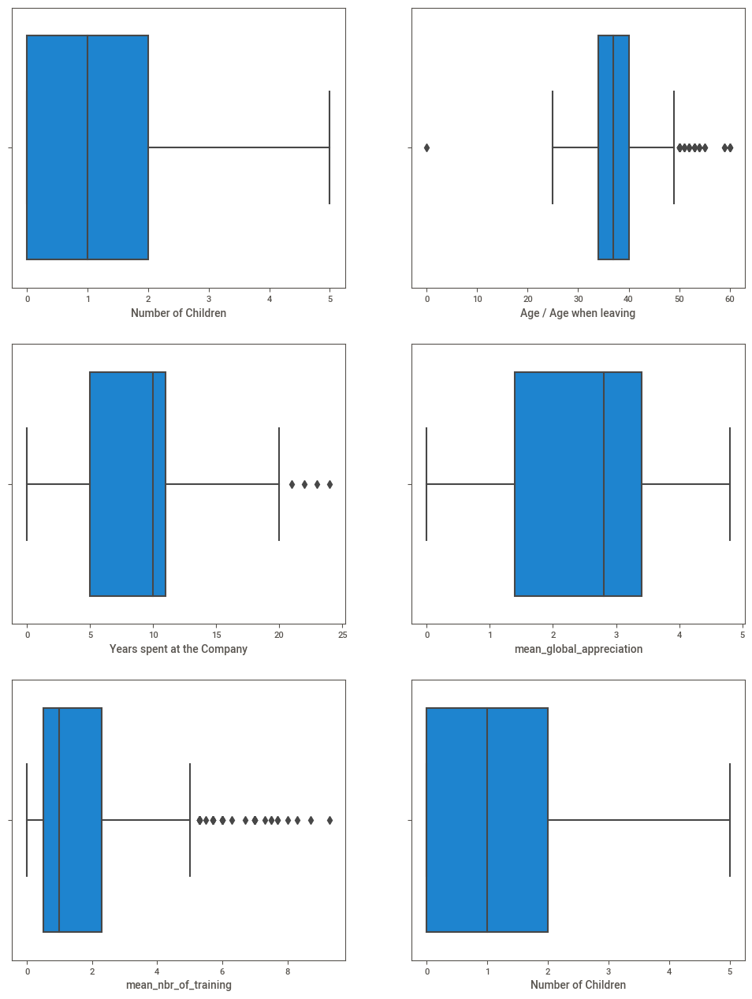

In [30]:
import matplotlib.gridspec as gridspec

# create figure window
fig = plt.figure(figsize=[12, 16]) 

# Creates grid 'gs' of a rows and b columns 
gs = gridspec.GridSpec(3, 2)


# Adds subplot 'ax' in grid 'gs' at position [x,y]
ax = plt.subplot(gs[0, 0])
sns.boxplot(x=data['Number of Children'])

#ax.set_ylabel('----') 
#Add y-axis label if necesary
ax = plt.subplot(gs[0, 1])
sns.boxplot(x=data['Age / Age when leaving'])


ax = plt.subplot(gs[1, 0])
sns.boxplot(x=data['Years spent at the Company'])

ax = plt.subplot(gs[1, 1])
sns.boxplot(x=data['mean_global_appreciation'])

ax = plt.subplot(gs[2, 0])
sns.boxplot(x=data['mean_nbr_of_training'])

ax = plt.subplot(gs[2, 1])
sns.boxplot(x=data['Number of Children'])

#add 'ax' to figure
fig.add_subplot(ax) 


In [31]:
# InterQuartile Range 1
Q1_mean_nbr_training = data['mean_nbr_of_training'].quantile(0.25)
Q3_mean_nbr_training = data['mean_nbr_of_training'].quantile(0.75)
IQR_1 = Q3_mean_nbr_training - Q1_mean_nbr_training
IQR_1 

1.7999999999999998

In [32]:
# InterQuartile Range 2
Q1_company_years = data['Years spent at the Company'].quantile(0.25)
Q3_company_years =data['Years spent at the Company'].quantile(0.75)
IQR_2 = Q1_company_years - Q1_company_years
IQR_2

0.0

In [33]:
data = data[~((data['mean_nbr_of_training'] < (Q1_mean_nbr_training - 1.5 * IQR_1)) |(data['mean_nbr_of_training'] > (Q3_mean_nbr_training + 1.5 * IQR_1)))]
data.shape

(1426, 16)

In [34]:
#data = data[~((data['Years spent at the Company'] < (Q1_company_years - 1.5 * IQR_2)) |(data['Years spent at the Company'] > (Q3_company_years + 1.5 * IQR_2)))]
#data.shape


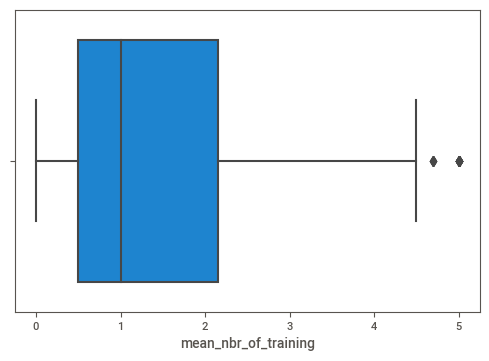

In [35]:
sns.boxplot(x=data['mean_nbr_of_training'])

In [36]:
data.columns

Index(['Left: Yes/ No', 'Department', 'Entry Date',
       'Years spent at the Company', 'Gender', 'Birth Date',
       'Age / Age when leaving', 'Marital Status', 'Number of Children',
       ' Bonus Coef', 'Assignment', 'Indexed Salary', 'Number of Hours',
       'Classification ', 'mean_global_appreciation', 'mean_nbr_of_training'],
      dtype='object')

In [37]:
#rename our columns 

new_names =  {'Left: Yes/ No': 'Churn', 'Department': 'department','Entry Date': 'entry_date',
             'Years spent at the Company': 'nbr_years_at_orange', 'Age / Age when leaving': 'quit_age','Gender': 'gender',
             'Birth Date': 'birth_date', 'Marital Status': 'marital_status','Number of Children': 'nbr_children',
             ' Bonus Coef': 'bonus_coef', 'Assignment': 'assignment','Indexed Salary': 'indexed_salary' , 
             'Number of Hours': 'work_hours', 'Classification ': 'position_code' }

data.rename(columns=new_names, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [38]:
data

,Churn,department,entry_date,nbr_years_at_orange,gender,birth_date,quit_age,marital_status,nbr_children,bonus_coef,assignment,indexed_salary,work_hours,position_code,mean_global_appreciation,mean_nbr_of_training
0,NO,DFI,7/1/2004,17.0,Masculin,5/21/1977,44.0,Marié(e),2.0,1.0,DFI RECOUVREMENT,12.79,40,A8.1,3.2,0.3
1,NO,DG,1/1/2004,17.0,Féminin,1/1/1975,46.0,Marié(e),2.0,1.0,SIEGE,9.27,40,unkown,2.3,0.0
2,NO,DRS,10/1/2004,17.0,Masculin,1/7/1966,55.0,Marié(e),2.0,2.0,CROISIERE CHARGUIA,32.24,40,CM1.1,2.8,3.3
3,NO,DRH,2/1/2005,16.0,Féminin,5/25/1978,43.0,Marié(e),1.0,1.0,DIVONA,14.14,40,A8.1,3.3,0.7
4,NO,DRS,12/1/2006,15.0,Masculin,9/25/1969,52.0,Marié(e),2.0,2.0,CROISIERE CHARGUIA,34.40,40,CM2.1,3.6,2.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1457,Yes,DMC,12/10/2012,8.0,Masculin,11/15/1973,47.0,Marié(e),2.0,2.0,NaN,46.24,40,CM3.1,3.2,3.0
1458,Yes,DRE,7/6/2020,0.0,Masculin,4/22/1984,36.0,Marié(e),2.0,2.0,NaN,32.25,40,unkown,0.0,NaN
1459,Yes,DME,1/1/2018,3.0,Féminin,6/24/1991,29.0,Marié(e),1.0,1.0,NaN,8.07,40,unkown,1.3,1.0
1460,Yes,DFI,2/8/2010,11.0,Féminin,2/16/1974,47.0,Marié(e),2.0,2.0,NaN,30.81,40,CM2.1,2.8,1.3


# II - Machine Learning process & Churn Prediction

In [39]:
# check null data distribution
data.isnull().sum()

Churn                         0
department                    0
entry_date                    0
nbr_years_at_orange           0
gender                        0
birth_date                    0
quit_age                      0
marital_status                2
nbr_children                 75
bonus_coef                   92
assignment                  322
indexed_salary                0
work_hours                    1
position_code                 0
mean_global_appreciation      0
mean_nbr_of_training         87
dtype: int64

As we can see, some features do still have missing values that need to be handled, thus we can not drop those records including null values as the data size will be reduced tremendeously. That is why, we will be Applying an imputation algorithm on the missing data of all columns.

In [40]:
# make copy to avoid changing original data (checkpoint)
backup_data = data.copy()

In [41]:
data.drop(columns= ['quit_age','work_hours'], inplace= True )

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [42]:
# verifying data type
data['entry_date'].iloc[[0]]

0    7/1/2004
Name: entry_date, dtype: object

In [43]:
data['entry_date'] = pd.to_datetime(data['entry_date'] ).astype(np.int64)
data['birth_date'] = pd.to_datetime(data['birth_date'] ).astype(np.int64)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [44]:
data.dtypes

Churn                        object
department                   object
entry_date                    int64
nbr_years_at_orange         float64
gender                       object
birth_date                    int64
marital_status               object
nbr_children                float64
bonus_coef                  float64
assignment                   object
indexed_salary              float64
position_code                object
mean_global_appreciation    float64
mean_nbr_of_training        float64
dtype: object

In [45]:
# collecting non numeric features for Ordinal encoding purpose
non_floats = []
for col in data:
    if data[col].dtypes == "object":
        non_floats.append(col)
categorical = non_floats
print (" List of Non numeric features that should be encoded for to be ready for the Machine learning process: \n" , categorical)

 List of Non numeric features that should be encoded for to be ready for the Machine learning process: 
 ['Churn', 'department', 'gender', 'marital_status', 'assignment', 'position_code']


In [46]:
categ_data = data[['Churn', 'department', 'gender', 'marital_status', 'assignment', 'position_code']]

In [47]:
categ_data.isnull().sum()

Churn               0
department          0
gender              0
marital_status      2
assignment        322
position_code       0
dtype: int64

In [48]:
#eliminate null values of marital status predictor
categ_data = categ_data[~((categ_data['marital_status'].isnull()))]

In [49]:
from sklearn.preprocessing import LabelEncoder


# creating instance of labelencoder
labelencoder = LabelEncoder()

# Encoding non numerical values

categ_data['assignment'] = labelencoder.fit_transform(categ_data['assignment'].astype(str))
dict_0 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

categ_data['marital_status'] = labelencoder.fit_transform(categ_data['marital_status'].astype(str))
dict1 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

categ_data['position_code'] = labelencoder.fit_transform(categ_data['position_code'].astype(str))
dict2 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

categ_data['department'] = labelencoder.fit_transform(categ_data['department'].astype(str))
dict3 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

categ_data['gender'] = labelencoder.fit_transform(categ_data['gender'].astype(str))
dict4 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

categ_data['Churn'] = labelencoder.fit_transform(categ_data['Churn'].astype(str))
dict5 = dict(zip(labelencoder.classes_, range(len(labelencoder.classes_))))

#creating a dictionary for the encoded features, to call during model interpretability step
mapping_data = {'marital_status': dict1 , 'position_code': dict2 ,
                'department': dict3 , 'gender': dict4, 'Churn': dict5 }

encoded_features_dictionary = pd.DataFrame(mapping_data)

categ_data.head()

,Churn,department,gender,marital_status,assignment,position_code
0,0,3,1,2,12,5
1,0,5,0,2,21,18
2,0,17,1,2,11,13
3,0,15,0,2,13,5
4,0,17,1,2,11,14


In [50]:
#Dropping unnecessary columns manually 
to_drop2 = ['Churn', 'department', 'gender', 'marital_status', 'assignment', 'position_code']
data.drop(to_drop2, inplace=True, errors='ignore' ,axis=1)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [51]:
ml_data = data.merge(categ_data, left_index=True, right_index=True)
ml_data.head()

,entry_date,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,Churn,department,gender,marital_status,assignment,position_code
0,1088640000000000000,17.0,233020800000000000,2.0,1.0,12.79,3.2,0.3,0,3,1,2,12,5
1,1072915200000000000,17.0,157766400000000000,2.0,1.0,9.27,2.3,0.0,0,5,0,2,21,18
2,1096588800000000000,17.0,-125712000000000000,2.0,2.0,32.24,2.8,3.3,0,17,1,2,11,13
3,1107216000000000000,16.0,264902400000000000,1.0,1.0,14.14,3.3,0.7,0,15,0,2,13,5
4,1164931200000000000,15.0,-8467200000000000,2.0,2.0,34.40,3.6,2.7,0,17,1,2,11,14


# Imputing null values:

before proceeding to the next step, we need to handle the missing values (NaN values)

In [52]:
ml_data.isnull().sum()

entry_date                   0
nbr_years_at_orange          0
birth_date                   0
nbr_children                75
bonus_coef                  92
indexed_salary               0
mean_global_appreciation     0
mean_nbr_of_training        87
Churn                        0
department                   0
gender                       0
marital_status               0
assignment                   0
position_code                0
dtype: int64

In [53]:
#import numpy as np
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(ml_data)
ml_data = pd.DataFrame(imp.transform(ml_data) , columns = ml_data.columns)

In [54]:
ml_data.head()

,entry_date,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,Churn,department,gender,marital_status,assignment,position_code
0,1.088640e+18,17.0,2.330208e+17,2.0,1.0,12.79,3.2,0.3,0.0,3.0,1.0,2.0,12.0,5.0
1,1.072915e+18,17.0,1.577664e+17,2.0,1.0,9.27,2.3,0.0,0.0,5.0,0.0,2.0,21.0,18.0
2,1.096589e+18,17.0,-1.257120e+17,2.0,2.0,32.24,2.8,3.3,0.0,17.0,1.0,2.0,11.0,13.0
3,1.107216e+18,16.0,2.649024e+17,1.0,1.0,14.14,3.3,0.7,0.0,15.0,0.0,2.0,13.0,5.0
4,1.164931e+18,15.0,-8.467200e+15,2.0,2.0,34.40,3.6,2.7,0.0,17.0,1.0,2.0,11.0,14.0


In [55]:
# Veryfying null values existance after treatement
ml_data.isnull().sum()

entry_date                  0
nbr_years_at_orange         0
birth_date                  0
nbr_children                0
bonus_coef                  0
indexed_salary              0
mean_global_appreciation    0
mean_nbr_of_training        0
Churn                       0
department                  0
gender                      0
marital_status              0
assignment                  0
position_code               0
dtype: int64

In [56]:
# reordering columns and putting the target variable last
ml_data = ml_data.reindex(columns=['entry_date', 'nbr_years_at_orange', 'birth_date', 
                                  'nbr_children', 'bonus_coef', 'indexed_salary',
                                  'mean_global_appreciation', 'mean_nbr_of_training','department', 
                                  'gender', 'marital_status', 'assignment', 'position_code', 'Churn'])

# Before moving to training the models, let's check our data for Multicollinearity

## Correlation 

   #### Limitations: 
    # Continious data only
    # Correlation does not necessarily imply causation
    # Linear Relationships only 



## Now before we move to vizualizing and analyzing our correlation table, let's first define what is Multicollinearity? 

####  - Multicollinearity is mainly the issue of having two features that are highly related to each other, which affects the correlation index of one or both of them with the target feature. 
####  Meaning, when we do have a Multicollinearity case, we do need to inspect our model and get rid of it, otherwise it will affect the model's accuracy ( unreliable estimaes and non sensical findings). 
####  - However, having a high correlation between features doesn't automatically mean that we have a multicollinearity situation . 
####  - High correlation between our features can be an early warning sign that there is a sort of problem, and we should investigate it.

### -------------------------------------------------------------------------------------------

### ---> The data correlation table contains duplicated values that we need to hide before vizualizing ( symmetry on a diagonal axis)
    # we need to create a mask for our plot 

In [57]:
# create a table of zeros having the same dimensions of our corr table
mask = np.zeros_like(ml_data.corr())  
mask

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [58]:
triangle_indices = np.triu_indices_from(mask) # create a triangle of indices for the mask object 
mask[triangle_indices] = True # true is for 1s, false is for 0s ; we now two triangles; for ones and for zeroes
mask

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

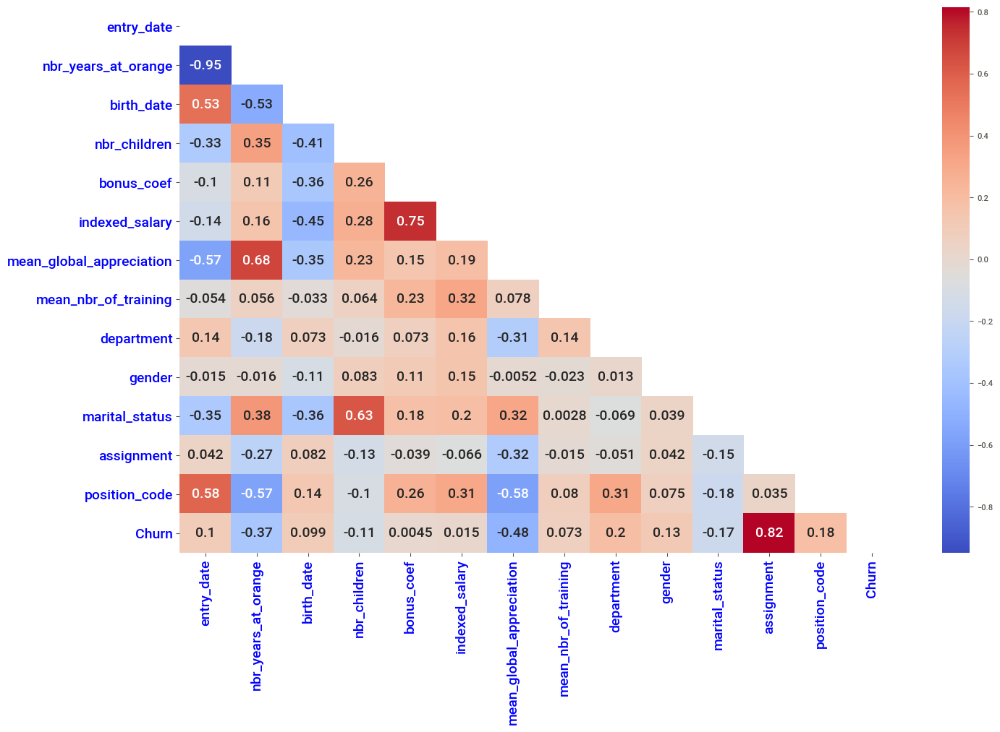

In [59]:
plt.figure(figsize=(16,10))
# we plot the corr table first 
sns.heatmap(ml_data.corr(), cmap="coolwarm", mask = mask, annot = True, annot_kws= {"size": 14}  ) 

# the second mask is the object name, first one is an attribute 
# If passed, data will not be shown in cells where mask is True, Cells with missing values are automatically masked

# annot : shows the correlation values within the plot 
# annot_kws: refers to providing the annot attribute with a size characteristic ( in a form of dictionary )

plt.xticks(fontsize = 14, color = 'blue')  
plt.yticks(fontsize = 14, color = 'blue')

plt.show()

### The Pearson correlation method ( the default one ) doesn't work for dummy variables , which is the case for features like Gender and Marital Status ( dummy variables ) or nbr_years_at_orange / bonus coef ( discrete variables)  

==> it is only valid for continous variables.

For instance , we can eliminate either "number of years at orange" or Entry date as both columns provide the same metric and are correlated with a correlation degree of -0.95 
( which makes sense since the more the entry date goes up, the less years within the company are)  

In [60]:
# Assignmet variable is highly correlated to the the target, thus it should be dropped
ml_data = ml_data.drop(columns= ["assignment","entry_date"], errors= 'ignore')

However, for other correlation combos such as Indexed_salary and bonus_coeff (0.75), we can not really conclude as we are dealing with two different types of data: discrete/Labels and continious, hence, we need an alternative to be able to examine correlation. 

### Going categorical

This isn't something that can be used to get new insights quickly. So something more is still required.
Going categorical
What we need is a measure of association between two categorical features that looks like correlation but works with categorical values — or, to put it another way, something that looks like correlation but works with categorical values. 
Cramér's V, as an alternative, is based on a simplified version of Pearson's Chi-Square Test and has a number of useful features:

+ The output is in the range [0,1], where 0 signifies no association and 1 implies full association, similar to correlation. (Unlike correlation, there are no negative values because no negative association exists.) There is either one or the other.)
+ Cramer's V, like correlation, is symmetrical, meaning it is unaffected by changing the x and y values.

However, because of the symmetry of Cramer's V's output, we lose crucial information when we solely use it.
That is, if the value of x is known, the value of y is still unknown, but if the value of y is known, the value of x is guaranteed. Due to the symmetry of Cramer's V, this valuable information is lost, hence we need an asymmetric measure of categorical feature association to preserve it. And this is what Theil's U is all about. 

Theil's U, also known as the Uncertainty Coefficient, is based on the conditional entropy between x and y — or, in human words, how many alternative states does y have, and how often do they occur, given the value of x. The output value, like Cramer's V, is in the range [0,1], with the same interpretations as previously — but unlike Cramer's V, it is asymmetric, meaning U(x,y)U(y,x) (while V(x,y)=V(y,x), where V is Cramer's V).

### Mixing the two solutions:
So now we have a technique to assess the association between two categorical features and two ways to assess the correlation between two continuous features. But what about a continuous feature and a categorical feature paired together? We may do this by using the Correlation Ratio (referred to as ETA) , which is the weighted variance of each category's mean divided by the variance of all samples.
To put it another way, the Correlation Ratio provides an answer to the following question: How well can we guess which group a continuous number belongs to? The output is in the range [0,1] just like the other two coefficients we've seen.

In [61]:
# must upload pandas version to make it work

# function ensuring the correlation association between continuous & discrete\dummy variables using the correlation ratio as a metric
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat)+1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0,cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

In [62]:
numcols = ml_data[['birth_date', 'indexed_salary', 'mean_global_appreciation', 'mean_nbr_of_training']]
catcols = ml_data[['nbr_children', 'bonus_coef', 'department', 'gender', 'marital_status', 'position_code', 'Churn']]

In [63]:
# testing the algorithm with only one feature combination
correlation_ratio(catcols['department'], numcols['mean_global_appreciation'])

0.4292718915356725

In [64]:
# Iterating columns and extracting all correlation_ratio Combinations

cat = []
num = []
corr_rat= []

for i in catcols: 
  for j in numcols:
    cat.append(i)
    num.append(j)
    corr_rat.append(correlation_ratio(catcols[i], numcols[j]))

In [65]:
# assign names to the lists.  
results = {'categorical_columns': cat , 'numerical_columns': num , 'correlation_ratio': corr_rat }  
  
# Create DataFrame  
cor_ratio_table = pd.DataFrame(results)  
cor_ratio_table

,categorical_columns,numerical_columns,correlation_ratio
0,nbr_children,birth_date,0.422437
1,nbr_children,indexed_salary,0.296920
2,nbr_children,mean_global_appreciation,0.421640
3,nbr_children,mean_nbr_of_training,0.137303
4,bonus_coef,birth_date,0.377313
5,bonus_coef,indexed_salary,0.792257
6,bonus_coef,mean_global_appreciation,0.389148
7,bonus_coef,mean_nbr_of_training,0.252612
8,department,birth_date,0.221984
9,department,indexed_salary,0.433791


#------------------------------------------------------------------
# Building, training and compairing ML models: 

In [66]:
#ml_data['assignment'] = ml_data['assignment'].astype(int)
ml_data['position_code'] = ml_data['position_code'].astype(int)
ml_data['nbr_years_at_orange'] = ml_data['nbr_years_at_orange'].astype(int)
ml_data['birth_date'] = ml_data['birth_date'].astype(int)
ml_data['nbr_children'] = ml_data['nbr_children'].astype(int)
ml_data['department'] = ml_data['department'].astype(int)
ml_data['marital_status'] = ml_data['marital_status'].astype(int)
ml_data['gender'] = ml_data['gender'].astype(int)
ml_data['Churn'] = ml_data['Churn'].astype(int)

In [67]:
ml_data.shape

(1424, 12)

In order to demonstrate the predict_model() function on unseen data, a sample of 20% of the rows has been withheld from the original dataset to be used for predictions. 

In [68]:
ml_data.tail()

,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,department,gender,marital_status,position_code,Churn
1419,8,122169600000000000,2,2.0,46.24,3.2,3.00000,9,1,2,15,1
1420,0,451440000000000000,2,2.0,32.25,0.0,1.40187,14,1,2,18,1
1421,3,677721600000000000,1,1.0,8.07,1.3,1.00000,10,0,2,18,1
1422,11,130204800000000000,2,2.0,30.81,2.8,1.30000,3,0,2,14,1
1423,11,591321600000000000,1,1.0,9.63,3.2,3.30000,3,1,2,3,1


In [69]:
unseen_data = ml_data.tail(1).drop(columns= ['Churn'])
unseen_data

,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,department,gender,marital_status,position_code
1423,11,591321600000000000,1,1.0,9.63,3.2,3.3,3,1,2,3


In [70]:
ml_data.drop(ml_data.tail(1).index, inplace=True)

In [71]:
data = ml_data.sample(frac=0.8, random_state=786)
data_unseen = ml_data.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (1138, 12)
Unseen Data For Predictions (285, 12)


In [72]:
from pycaret.classification import *

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [73]:
exp_clf = setup(data = data, target = 'Churn', session_id= 123 , silent = True,  normalize = True,
                transformation = True , ignore_low_variance = True,
                remove_multicollinearity = True, multicollinearity_threshold = 0.95 )

,Description,Value
0,session_id,123
1,Target,Churn
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(1138, 12)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


In [74]:
models_comparison = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9108,0.9446,0.6954,0.8777,0.7714,0.7176,0.7280,0.157
xgboost,Extreme Gradient Boosting,0.9108,0.9441,0.7176,0.8558,0.7774,0.7226,0.7291,4.574
catboost,CatBoost Classifier,0.9108,0.9516,0.6895,0.8789,0.7664,0.7134,0.7253,1.803
lightgbm,Light Gradient Boosting Machine,0.9045,0.9462,0.7232,0.8284,0.7670,0.7078,0.7139,0.119
rf,Random Forest Classifier,0.9008,0.9492,0.6317,0.8896,0.7324,0.6748,0.6931,0.525
et,Extra Trees Classifier,0.8781,0.9330,0.5363,0.8678,0.6589,0.5903,0.6176,0.474
ada,Ada Boost Classifier,0.8718,0.9102,0.6725,0.7383,0.6953,0.6153,0.6224,0.131
knn,K Neighbors Classifier,0.8694,0.8786,0.5768,0.7757,0.6601,0.5820,0.5924,0.123
ridge,Ridge Classifier,0.8693,0.0000,0.5255,0.8413,0.6395,0.5653,0.5929,0.016
dt,Decision Tree Classifier,0.8681,0.8207,0.7350,0.6924,0.7095,0.6246,0.6279,0.019


In [75]:
catboost = create_model('catboost', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8875,0.9659,0.5556,0.9091,0.6897,0.6258,0.6541
1,0.9000,0.9606,0.6667,0.8571,0.7500,0.6887,0.6972
2,0.8500,0.8754,0.5000,0.7500,0.6000,0.5122,0.5281
3,0.9000,0.9292,0.6667,0.8571,0.7500,0.6887,0.6972
4,0.9875,0.9973,1.0000,0.9474,0.9730,0.9649,0.9654
5,0.9125,0.9552,0.6111,1.0000,0.7586,0.7089,0.7410
6,0.9367,0.9753,0.7647,0.9286,0.8387,0.7998,0.8056
7,0.9620,0.9877,0.8824,0.9375,0.9091,0.8851,0.8858
8,0.8481,0.9175,0.4706,0.7273,0.5714,0.4842,0.5012
9,0.9241,0.9517,0.7778,0.8750,0.8235,0.7754,0.7775


In [76]:
encoded_features_dictionary

,marital_status,position_code,department,gender,Churn
Célibataire,0.0,NaN,NaN,NaN,NaN
Divorcé(e),1.0,NaN,NaN,NaN,NaN
Marié(e),2.0,NaN,NaN,NaN,NaN
Veuf(ve),3.0,NaN,NaN,NaN,NaN
A3.1,NaN,0.0,NaN,NaN,NaN
A4.1,NaN,1.0,NaN,NaN,NaN
A5.1,NaN,2.0,NaN,NaN,NaN
A6.1,NaN,3.0,NaN,NaN,NaN
A7.1,NaN,4.0,NaN,NaN,NaN
A8.1,NaN,5.0,NaN,NaN,NaN


## In order to plot different types of Model plots, we type the following command : plot_model(model_name, plot= 'check_the_following_list' )

  #Area Under the Curve	--> ‘auc’
  #Discrimination Threshold	--> ‘threshold’
  #Precision Recall Curve	--> ‘pr’
  #Confusion Matrix	--> ‘confusion_matrix’
  #Class Prediction Error -->	‘error’
  #Classification Report -->	‘class_report’
  #Decision Boundary -->	‘boundary’
  #Recursive Feature Selection -->	‘rfe’
  #Learning Curve -->	‘learning’
  #Manifold Learning -->	‘manifold’
  #Calibration Curve -->	‘calibration’
  #Validation Curve -->	‘vc’
  #Dimension Learning -->	‘dimension’
  #Feature Importance -->	‘feature’
  #Model Hyperparameter -->	‘parameter’

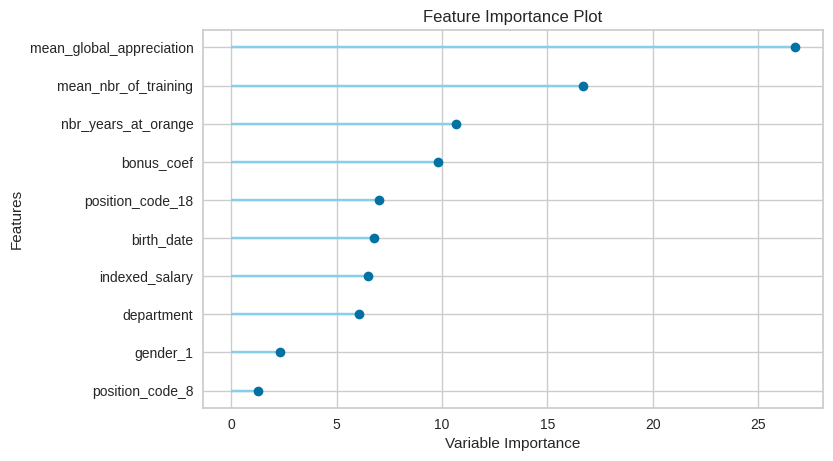

In [77]:
plot_model(catboost, plot= 'feature' )

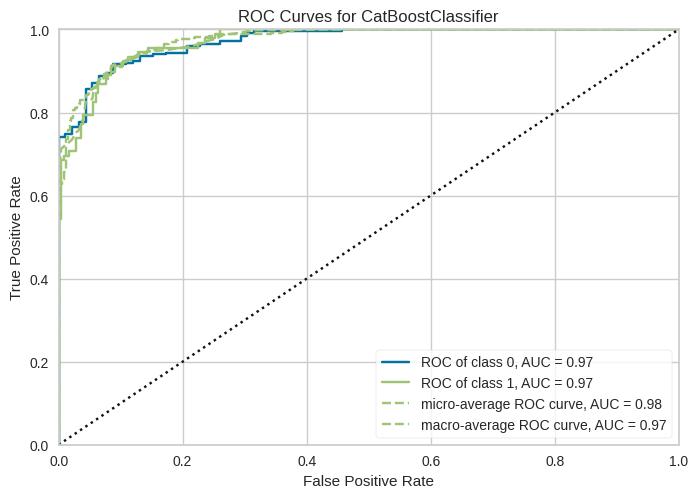

In [78]:
plot_model(catboost, plot= 'auc' )

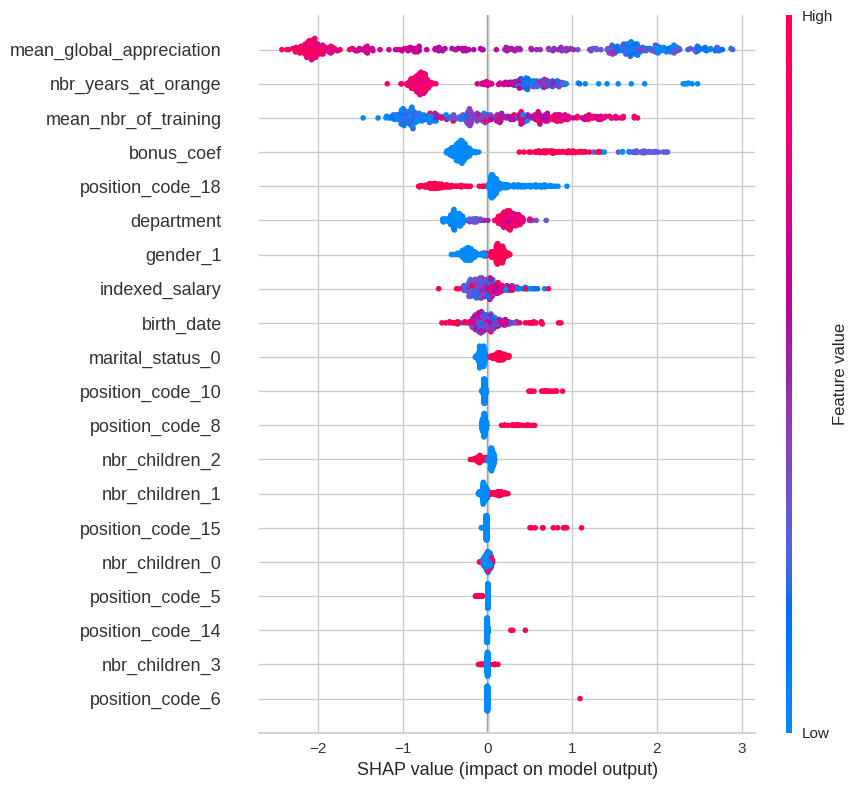

In [79]:
interpret_model(catboost)

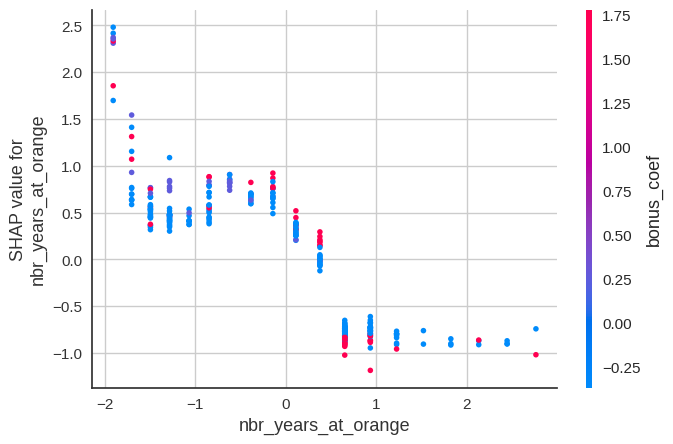

In [80]:
interpret_model(catboost,  plot= 'correlation')

In [81]:
# interpreting model at the observation number 10
interpret_model(catboost, plot = 'reason', observation = 10)

In [82]:
interpret_model(catboost,  plot= 'reason')

## Finalizing the Prediction Process: 



In [83]:
# finalize a model
catboost_final = finalize_model(catboost)

In [84]:
# generate predictions on test unseen data
predictions_test = predict_model(catboost_final, data = data_unseen)

In [85]:
predictions_test.head()

,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,department,gender,marital_status,position_code,Churn,Label,Score
0,16,264902400000000000,1,1.0,14.14,3.3,0.7,15,0,2,5,0,0,0.9972
1,13,391564800000000000,2,1.0,14.75,2.8,1.0,17,0,2,3,0,0,0.9884
2,13,359596800000000000,2,2.0,27.00,3.8,2.3,3,1,2,13,0,0,0.9908
3,12,82771200000000000,1,1.0,13.74,3.8,0.7,1,0,2,5,0,0,0.9988
4,12,369100800000000000,2,2.0,29.01,3.8,1.7,14,0,2,14,0,0,0.9714


In [86]:
data_unseen.head()

,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,department,gender,marital_status,position_code,Churn
0,16,264902400000000000,1,1.0,14.14,3.3,0.7,15,0,2,5,0
1,13,391564800000000000,2,1.0,14.75,2.8,1.0,17,0,2,3,0
2,13,359596800000000000,2,2.0,27.00,3.8,2.3,3,1,2,13,0
3,12,82771200000000000,1,1.0,13.74,3.8,0.7,1,0,2,5,0
4,12,369100800000000000,2,2.0,29.01,3.8,1.7,14,0,2,14,0


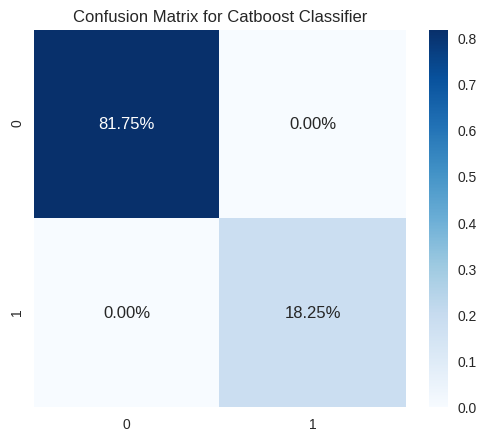

In [87]:
from sklearn import metrics 

y_pred = predictions_test['Churn']
y_test = data_unseen['Churn']

#Get the confusion matrix
cf_matrix = metrics.confusion_matrix(y_test, y_pred)

# visualizing the confusion matrix

plt.rcParams["figure.figsize"] = (6,5) 
plt.title('Confusion Matrix for Catboost Classifier')
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Blues')

In [88]:
# generate predictions on recently entered unseen row
predict_employee = predict_model(catboost_final, data = unseen_data)

In [89]:
predict_employee

,nbr_years_at_orange,birth_date,nbr_children,bonus_coef,indexed_salary,mean_global_appreciation,mean_nbr_of_training,department,gender,marital_status,position_code,Label,Score
1423,11,591321600000000000,1,1.0,9.63,3.2,3.3,3,1,2,3,0,0.9382
